# Basic analysis of test data

Looking for obviouse problem, like many same values in a row.
Found 55 locatons with 46 zeros in a row.

In [2]:
import numpy as np 
import pandas as pd
import torch, torch.nn as nn, time
from torch.utils.data import Dataset, DataLoader

from nnViz_pytorch import *
import matplotlib.pylab as plt
plt.style.use(['Solarize_Light2'])
%matplotlib inline
!pwd
N = 96 
F = 4
CPU = torch.device('cpu')
device = CPU

/home/irina/Hackathon/environmental-hackathon


In [3]:
test_red = np.load("data/test_data_reduced.npy")
test_red.shape

(9898, 960)

In [4]:
pred_red = np.load("data/test_pred_reduced.npy")
pred_red.shape

(9898, 960)

In [41]:
test = np.load("data/test_data_complete.npy")
test.shape

(9898, 2112)

In [6]:
pred = np.load("data/test_pred_complete.npy")
pred.shape

(9898, 2112)

In [61]:
def sumup(a):
    n_ts = 96
    n_ch = 4
    n_ty = 4
    b = np.zeros((a.shape[0], a.shape[1]- n_ty*(n_ch-1)*n_ts))
    for i in range(n_ty):
        for j in range(n_ts):
            c = np.column_stack((a[:, j+k*n_ts] for k in range(n_ch*i,n_ch*(i+1))))
            #print(c.shape)
            b[:,i*n_ts + j] = np.median(c, axis=1)            
    b[:,-6*n_ts:] = a[:,-6*n_ts:]
    c = copy.deepcopy(a)
    for i in range(n_ty):
        for j in range(n_ch):
            c[:,(i*4+j)*96:(i*4+j+1)*96] = b[:,i*96:(i+1)*96]
    return c

In [62]:
def same(b):
    a = np.array(b)
    if sum(abs(a - a[0])) == 0: 
   #     print("same =", a)
        return True
    return False
 
def bs(dd, n):
    a = 0
    for i in range(len(dd)-n):
        d = dd[i:i+n]
   #    print("i=",i, d)
        if same(d):
            a = i + 1
            break
    return a    

def broken_sensor(data, n):
    a = []
    c = []
    for i in range(len(data)):
       # print("i =", i)
        d = bs(data[i,0:N*F*4], n) 
        if d:
            a.append(i)
            c.append(d-1)
            continue
    return a, c    

In [63]:
a, c = broken_sensor(test,20)
print(a, c)

[49, 162, 180, 277, 420, 439, 667, 686, 745, 1147, 1358, 1394, 1621, 1804, 1861, 1940, 3059, 3152, 4009, 4380, 4381, 4695, 4819, 4870, 5074, 5092, 5158, 5269, 5303, 5502, 5562, 5589, 5778, 5788, 6066, 6269, 6284, 6303, 6378, 6702, 6940, 7443, 7673, 7688, 8008, 8103, 8380, 8450, 8623, 8765, 8866, 8983, 9042, 9253, 9654] [397, 448, 138, 547, 1327, 1316, 1477, 189, 320, 994, 675, 1010, 9, 393, 1421, 623, 1131, 1443, 1168, 275, 990, 1107, 1168, 99, 423, 1308, 1070, 970, 91, 1004, 523, 864, 249, 971, 954, 270, 923, 1131, 623, 925, 949, 904, 857, 623, 1403, 510, 741, 590, 365, 519, 214, 1137, 588, 1264, 359]


In [65]:
np.save("broken_sensor.npy", (a,c))


In [66]:
a1,c1 = np.load("broken_sensor.npy")

In [67]:
print(a1, c1)

[  49  162  180  277  420  439  667  686  745 1147 1358 1394 1621 1804
 1861 1940 3059 3152 4009 4380 4381 4695 4819 4870 5074 5092 5158 5269
 5303 5502 5562 5589 5778 5788 6066 6269 6284 6303 6378 6702 6940 7443
 7673 7688 8008 8103 8380 8450 8623 8765 8866 8983 9042 9253 9654] [ 397  448  138  547 1327 1316 1477  189  320  994  675 1010    9  393
 1421  623 1131 1443 1168  275  990 1107 1168   99  423 1308 1070  970
   91 1004  523  864  249  971  954  270  923 1131  623  925  949  904
  857  623 1403  510  741  590  365  519  214 1137  588 1264  359]


In [153]:
print(a)

[49, 162, 180, 277, 420, 439, 667, 686, 745, 1147, 1358, 1394, 1621, 1804, 1861, 1940, 3059, 3152, 4009, 4380, 4381, 4695, 4819, 4870, 5074, 5092, 5158, 5269, 5303, 5502, 5562, 5589, 5778, 5788, 6066, 6269, 6284, 6303, 6378, 6702, 6940, 7443, 7673, 7688, 8008, 8103, 8380, 8450, 8623, 8765, 8866, 8983, 9042, 9253, 9654]


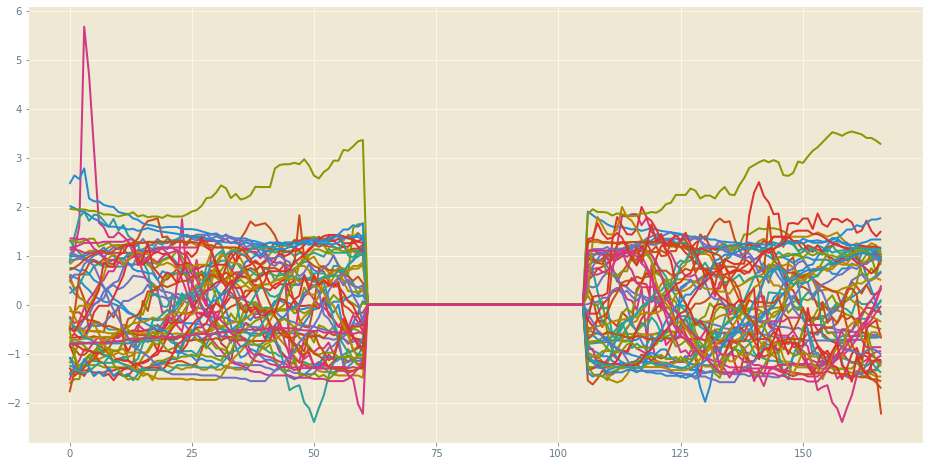

In [177]:
fig = plt.figure(figsize=(16,8))
for i in range(len(c)):
    plt.plot(test[a[i], c[i]-61:c[i]+106] )

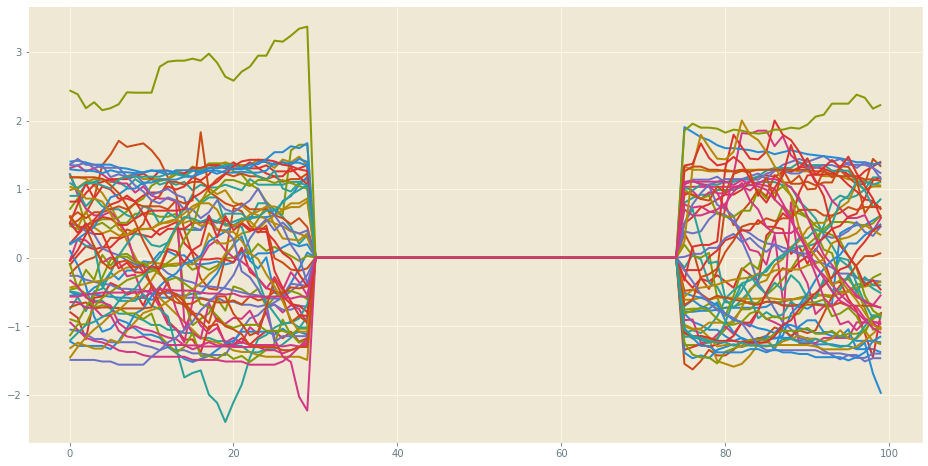

In [175]:
fig = plt.figure(figsize=(16,8))
for i in range(len(c)):
    plt.plot(test[a[i], c[i]-30:c[i]+70] )

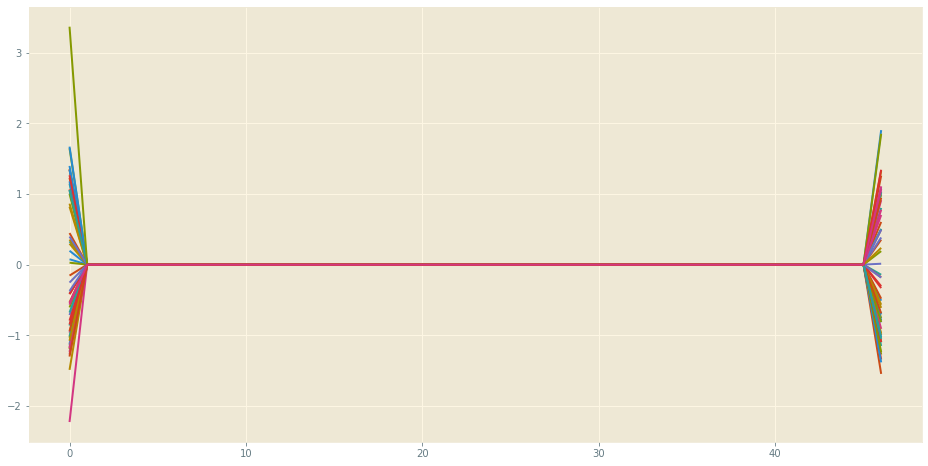

In [163]:
fig = plt.figure(figsize=(16,8))
for i in range(len(c)):
    plt.plot(test[a[i], c[i]-1:c[i]+46] )

In [164]:
anom1 = [ test[i, :] for i in a]

In [168]:
print(len(anom1), len(anom1[3]))


55 2112


In [279]:
anomaly_1 = np.array([test[i, :] for i in a])

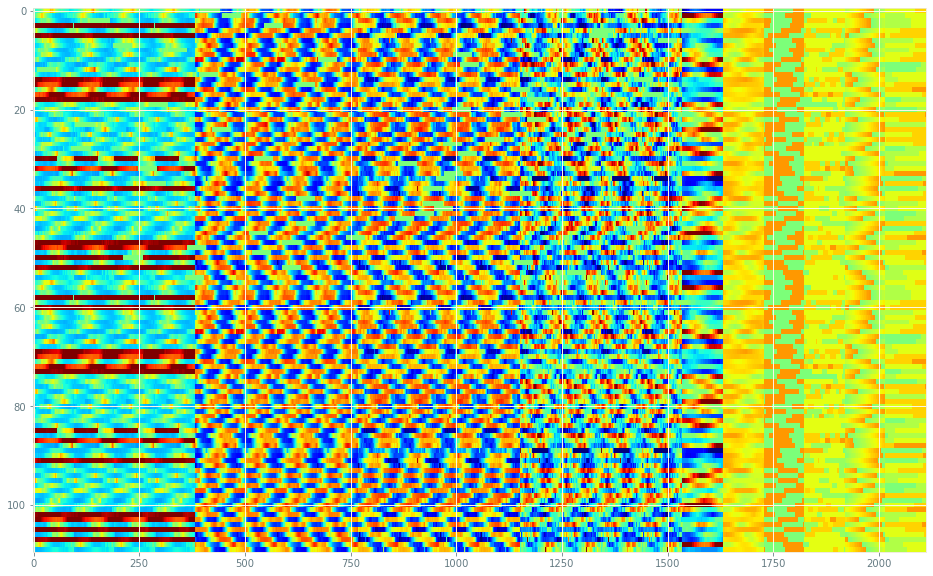

In [302]:
fig = plt.figure(figsize=(16,10))

plt.imshow(np.concatenate((anomaly_1,fixed), axis=0), cmap='jet', vmin=-2, vmax=2, interpolation='nearest', aspect='auto')

In [206]:
test = np.load("data/test_data_complete.npy")
test.shape


(9898, 2112)

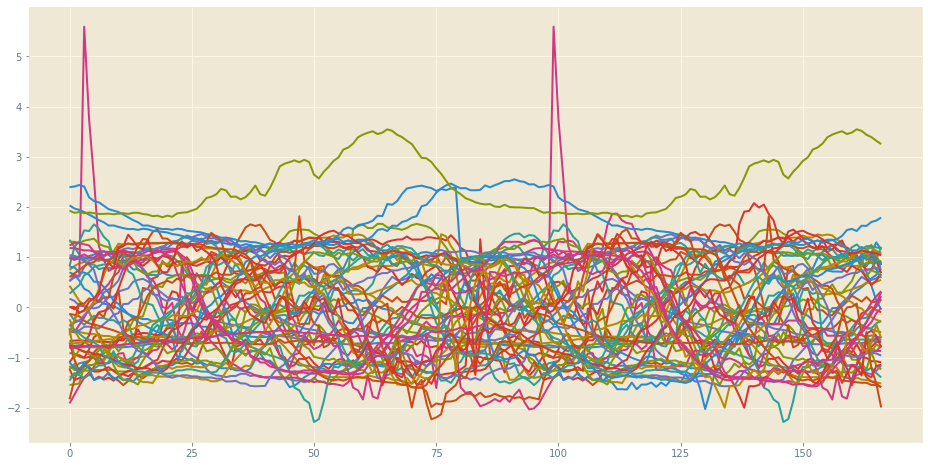

In [297]:
fig = plt.figure(figsize=(16,8))
for i in range(len(c)):
    plt.plot(test[a[i], c[i]-61:c[i]+106] )
 

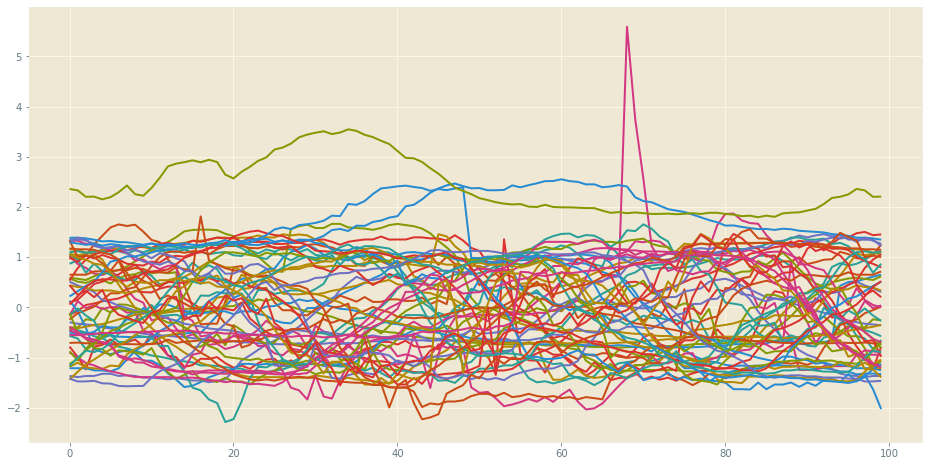

In [298]:
fig = plt.figure(figsize=(16,8))
for i in range(len(c)):
    plt.plot(test[a[i], c[i]-30:c[i]+70] )

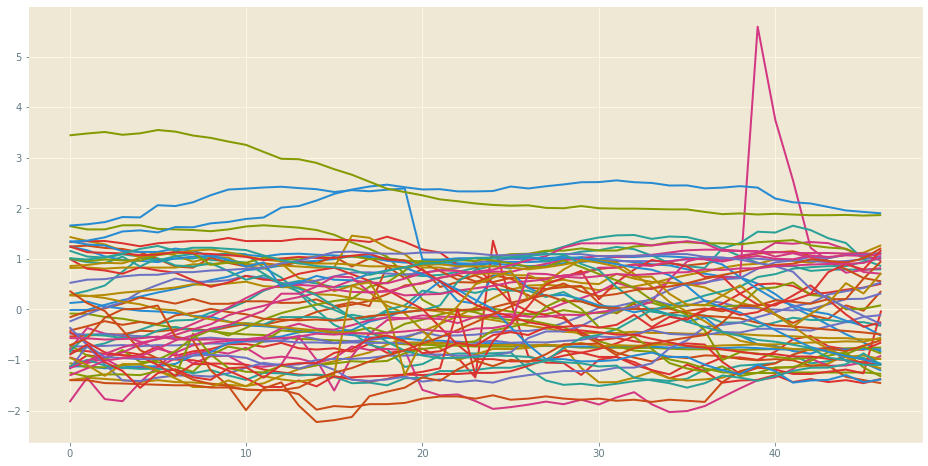

In [287]:
plt.figure(figsize=(20,6));


<ipython-input-286-9de9e34bc670>:8: FutureWarning: arrays to stack must be passed as a "sequence" type such as list or tuple. Support for non-sequence iterables such as generators is deprecated as of NumPy 1.16 and will raise an error in the future.
  c = np.column_stack((a[:, j+k*n_ts] for k in range(n_ch*i,n_ch*(i+1))))


(55, 2112)

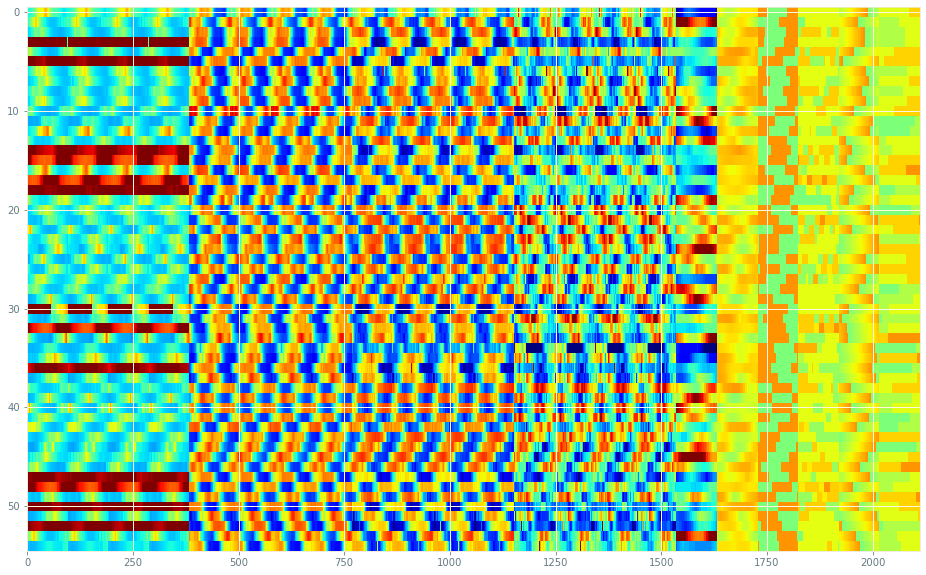

In [288]:
fig = plt.figure(figsize=(16,10))
plt.imshow(fixed, cmap='jet', vmin=-2, vmax=2, interpolation='nearest', aspect='auto')

In [294]:
#a1, c1 = broken_sensor(fixed,20)
#print(a1, c1)
#anomaly_1 = np.array([test[i, :] for i in a])
for i, j in enumerate(a):
    test[j, :] = fixed[i, :] 

In [317]:
Anomaly1 = a
np.save("anom1.npy", Anomaly1)

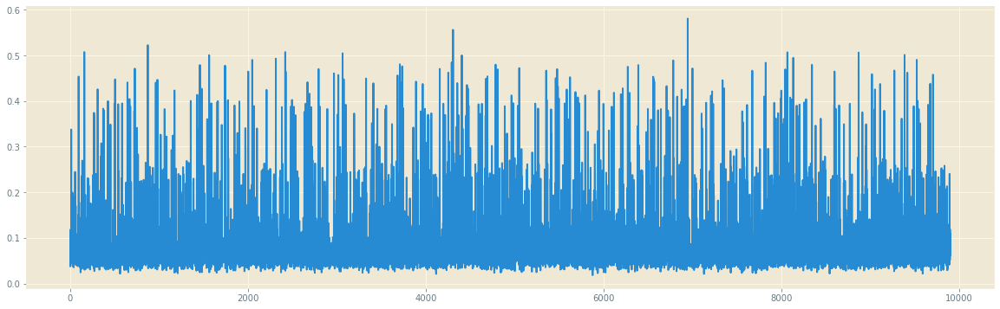

In [15]:
plt.figure(figsize=(20,6));
plt.plot(mse4)

In [6]:
import numpy as np
import pandas as pd
import seaborn as sns
import matplotlib.pyplot as plt
from scipy import stats
#sumup

def sumup(a):
    n_ts = 96
    n_ch = 4
    n_ty = 4
    b = np.zeros((a.shape[0], a.shape[1]- n_ty*(n_ch-1)*n_ts))
    for i in range(n_ty):
        for j in range(n_ts):
            c = np.column_stack((a[:, j+k*n_ts] for k in range(n_ch*i,n_ch*(i+1))))
            #print(c.shape)
            b[:,i*n_ts + j] = np.median(c, axis=1)            
    b[:,-6*n_ts:] = a[:,-6*n_ts:]
    c = copy.deepcopy(a)
    for i in range(n_ty):
        for j in range(n_ch):
            c[:,(i*4+j)*96:(i*4+j+1)*96] = b[:,i*96:(i+1)*96]
    return c



In [7]:
import copy
#import inspect
#lines = inspect.getsource(sumup)
#print(lines)

In [8]:
test = np.load("data/test_data_complete.npy")
test.shape

(9898, 2112)

In [9]:
smoo = sumup(test)

<ipython-input-6-26984bc84cb7>:15: FutureWarning: arrays to stack must be passed as a "sequence" type such as list or tuple. Support for non-sequence iterables such as generators is deprecated as of NumPy 1.16 and will raise an error in the future.
  c = np.column_stack((a[:, j+k*n_ts] for k in range(n_ch*i,n_ch*(i+1))))


In [14]:
np.save("data/test_smoo_complete.npy", smoo)
smoo.shape


(9898, 2112)

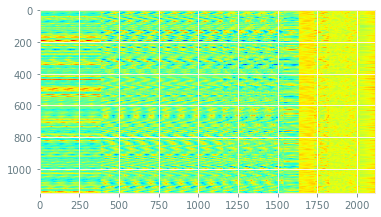

In [19]:
plt.imshow(smoo[:96*12,:], cmap='jet', vmin=-2, vmax=2)

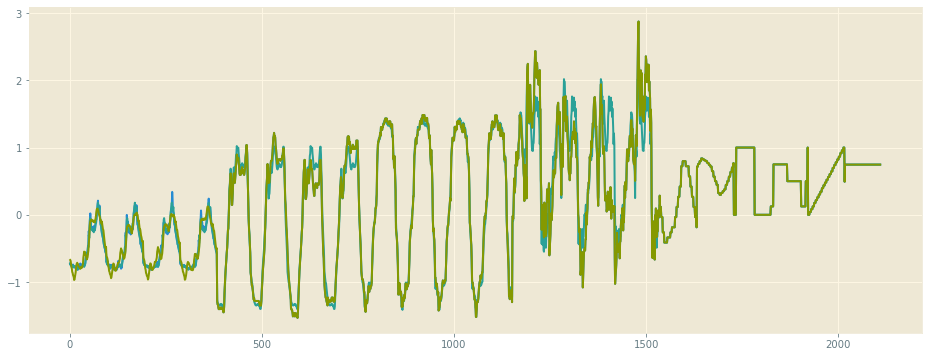

In [32]:
plt.figure(figsize=(16,6));
i = 9298
i = 3050
i=50
plt.plot(test[i])
plt.plot(smoo[i])
plt.plot(pred[i])

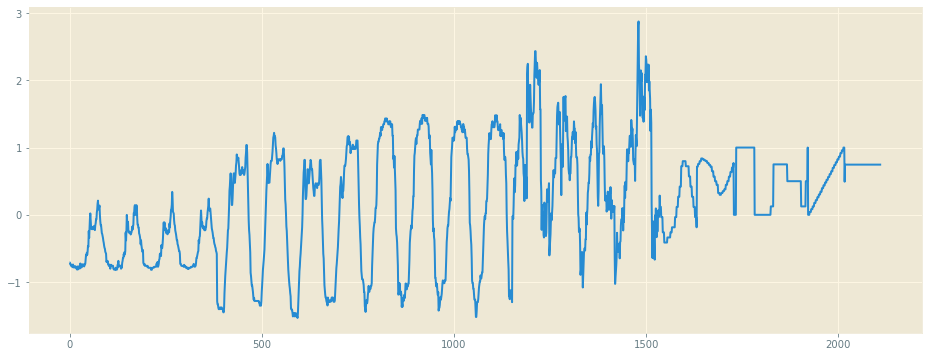

In [29]:
plt.figure(figsize=(16,6)); 
plt.plot(test[i])

In [30]:
pred = np.load("data/test_pred_complete.npy")
pred.shape

(9898, 2112)

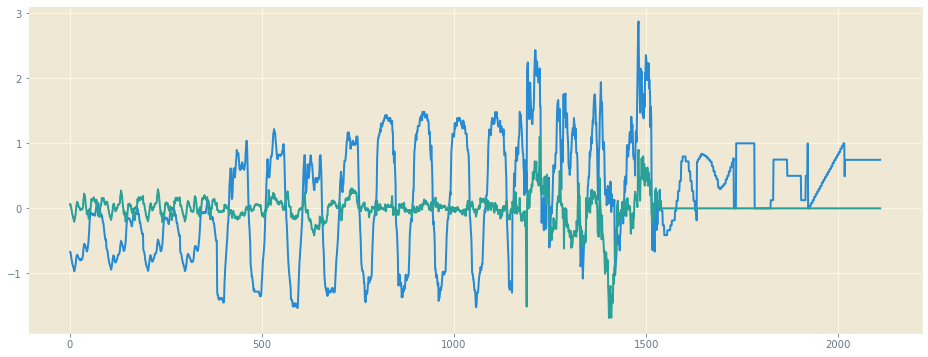

In [34]:
plt.figure(figsize=(16,6)); 
plt.plot(pred[i])
plt.plot(pred[i] - smoo[i])

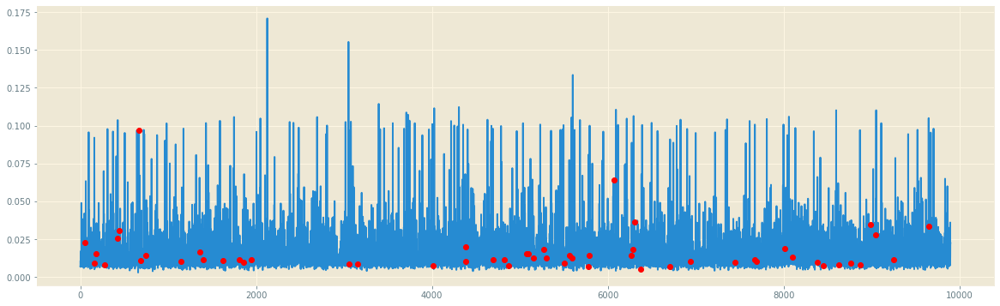

In [315]:
plt.figure(figsize=(20,6)); 
plt.plot(mse3)
plt.plot(a, mse3[a], "ro")

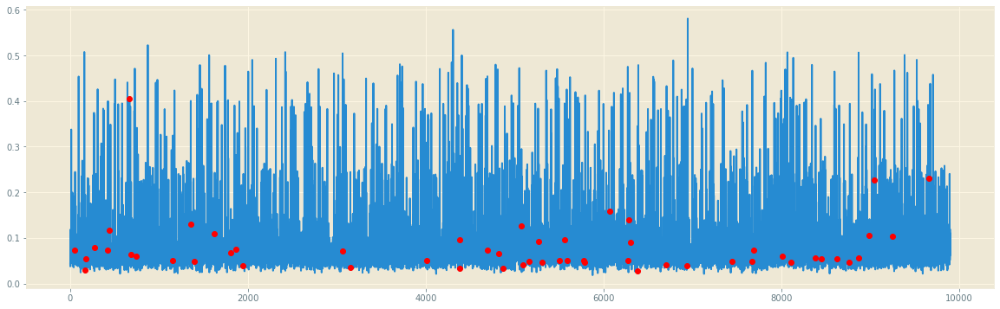

In [316]:
plt.figure(figsize=(20,6)); 
plt.plot(mse4)
plt.plot(a, mse4[a], "ro")

In [25]:
def thrcurve(err):
    n_outliers = []
    thresholds = []
    n = 100
    maxe = max(err)
    mine = sum(err)/len(err)
    for i in reversed(range(n)):
        th = mine + i *(maxe-mine)/n
        a = len([e for e in err if e >th])
        if a > 300:
            #print(a, th, maxe)
            mine = th
            break
    for i in range(n):
        th = mine + i *(maxe-mine)/n
        n_outliers.append(len([e for e in err if e >th]))
        thresholds.append(th) 
    return thresholds, n_outliers

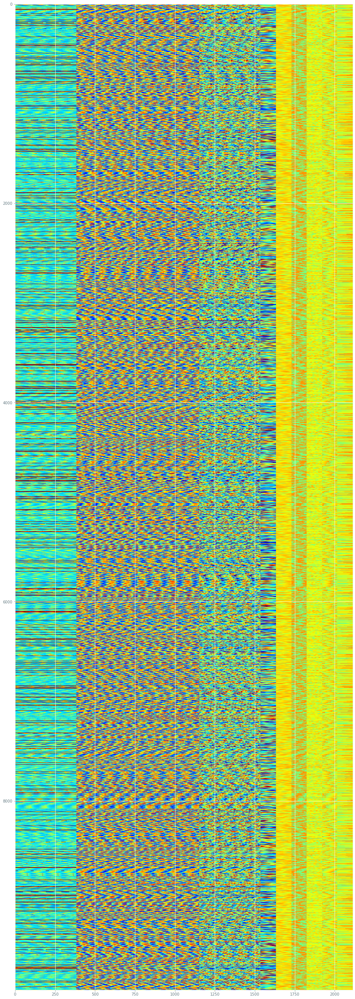

In [12]:
fig = plt.figure(figsize=(16,48))
#plt.imshow(test - smoo, cmap='jet', vmin=-0.1, vmax=0.1)
#fig = plt.figure(figsize=(16,10))

plt.imshow(smoo, cmap='jet', vmin=-2, vmax=2, interpolation='nearest', aspect='auto')

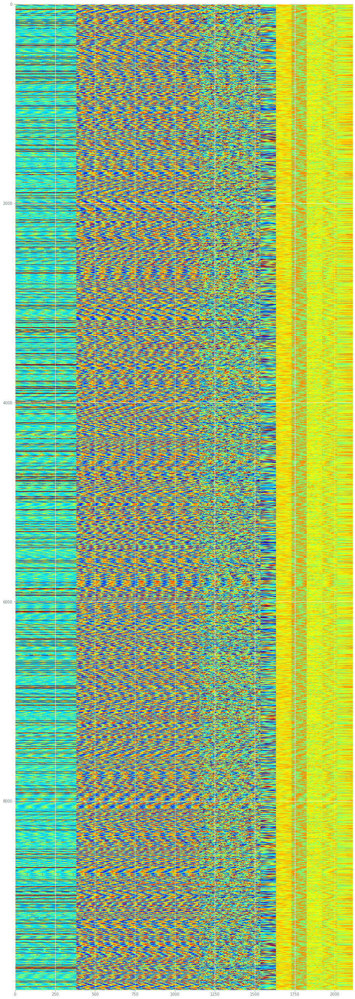

In [13]:
fig = plt.figure(figsize=(16,48))
plt.imshow(test, cmap='jet', vmin=-2, vmax=2, interpolation='nearest', aspect='auto')


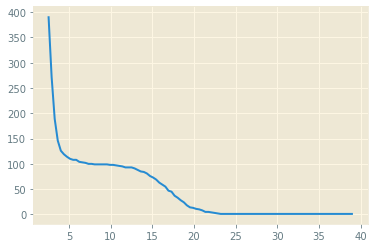

In [28]:
thresholds, outliers = thrcurve(mse1/sum(mse1)*10000)
plt.plot(thresholds, outliers)

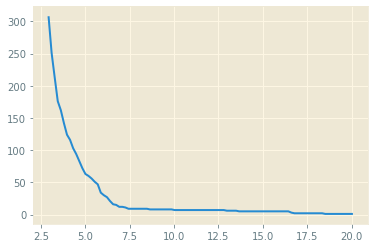

In [29]:
thresholds, outliers = thrcurve(mse2/sum(mse2)*10000)
plt.plot(thresholds, outliers)

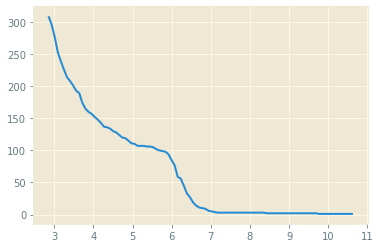

In [30]:
thresholds, outliers = thrcurve(mse3/sum(mse3)*10000)
plt.plot(thresholds, outliers)

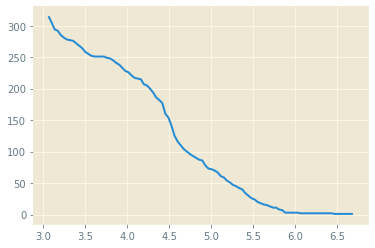

In [31]:
thresholds, outliers = thrcurve(mse4/sum(mse4)*10000)
plt.plot(thresholds, outliers)

In [32]:
train_hum = train_red[:, N*3: N*4]
test_hum  = test_red[:,  N*3: N*4]
DL_Train_hum = DataLoader(train_hum.astype('float32'), batch_size=16, shuffle = True )
DL_Test_hum  = DataLoader( test_hum.astype('float32'), batch_size=1 , shuffle = False )
#model_hum, loss_hum = train_model( model, DL_Train_hum, targetDevice, nEpochs)
model_hum, loss_hum = train_model( model_hum, DL_Train_hum, targetDevice, nEpochs)

DL_Train_hum2 = DataLoader(test_hum.astype('float32'), batch_size=16, shuffle = True )
model_hum, loss_hum = train_model( model_hum, DL_Train_hum2, targetDevice, 20) 
torch.save( model_hum, "model_hum.v1.pth")


NameError: name 'train_red' is not defined

In [ ]:
plt.figure(figsize=(6,6));
plt.plot(loss_hum)
plt.title('Loss History'); plt.xlabel('epoch'); plt.ylabel('cumulative loss');


In [ ]:
mse_errors_hum = evaluate_model( model_hum, DL_Test_hum, targetDeviceGPU, len(test_red))
print(len(mse_errors_hum))
plt.figure(figsize=(16,6));
plt.plot(mse_errors_hum)

In [ ]:
plt.plot()

In [8]:
c = [397, 448, 138, 547, 1327, 1316, 1477, 189, 320, 994, 675, 1010, 9, 393, 1421, 623, 1131, 1443, 1168, 275, 990, 1107, 1168, 99, 423, 1308, 1070, 970, 91, 1004, 523, 864, 249, 971, 954, 270, 923, 1131, 623, 925, 949, 904, 857, 623, 1403, 510, 741, 590, 365, 519, 214, 1137, 588, 1264, 359]
a = [49, 162, 180, 277, 420, 439, 667, 686, 745, 1147, 1358, 1394, 1621, 1804, 1861, 1940, 3059, 3152, 4009, 4380, 4381, 4695, 4819, 4870, 5074, 5092, 5158, 5269, 5303, 5502, 5562, 5589, 5778, 5788, 6066, 6269, 6284, 6303, 6378, 6702, 6940, 7443, 7673, 7688, 8008, 8103, 8380, 8450, 8623, 8765, 8866, 8983, 9042, 9253, 9654]

In [9]:
len(a)

55

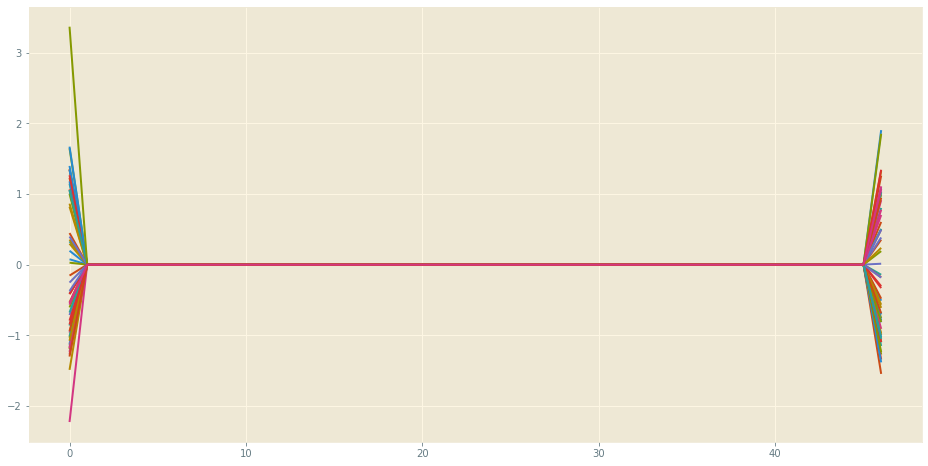

In [10]:
fig = plt.figure(figsize=(16,8))
for i in range(len(c)):
    plt.plot(test[a[i], c[i]-1:c[i]+46] )

In [63]:
test = np.load("data/test_data_complete.npy")
pred = np.load("data/test_pred_complete.npy")

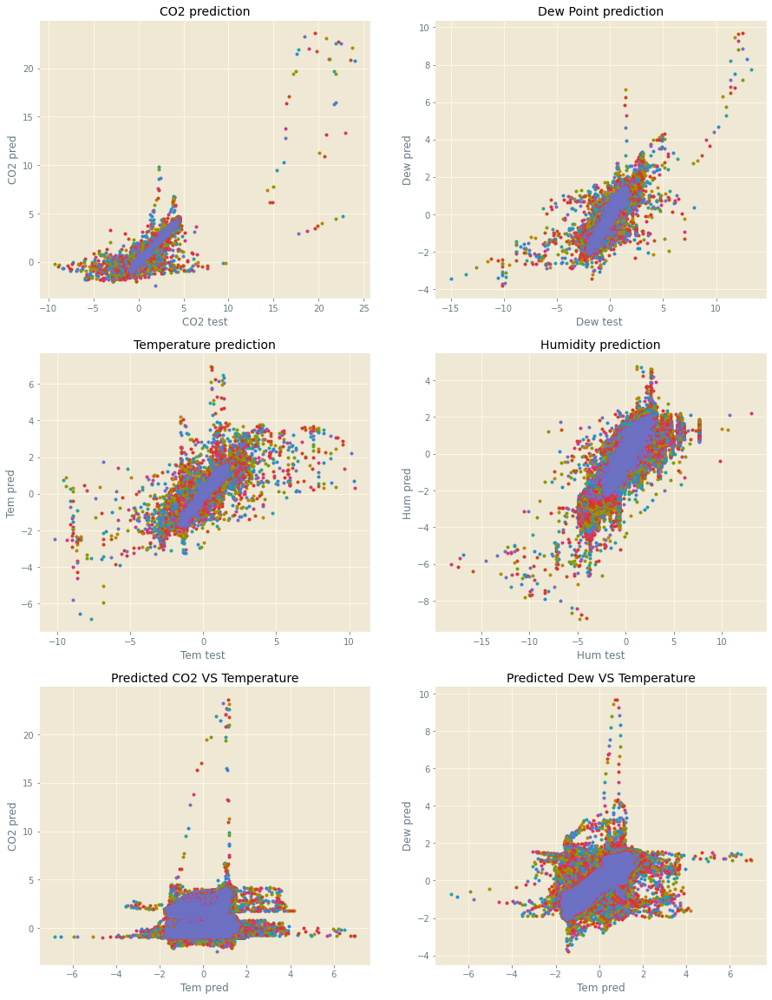

In [64]:
fs = 14
fig, axs = plt.subplots(3,2,figsize=(15,20))#, constrained_layout=True)
a = test
b = pred
i = 0
axs[0,0].plot(a[:,i*F*N :(i+1)*F*N], b[:,i*F*N :(i+1)*F*N], '.')
axs[0,0].set_title('CO2 prediction', fontsize=fs)
axs[0,0].set_xlabel('CO2 test')
axs[0,0].set_ylabel('CO2 pred')
i=1
axs[1,0].plot(a[:,i*F*N :(i+1)*F*N], b[:,i*F*N :(i+1)*F*N], '.')
axs[1,0].set_title('Temperature prediction',  fontsize=fs)
axs[1,0].set_xlabel('Tem test ')
axs[1,0].set_ylabel('Tem pred')
i=2
axs[0,1].plot(a[:,i*F*N :(i+1)*F*N], b[:,i*F*N :(i+1)*F*N], '.')
axs[0,1].set_title('Dew Point prediction',  fontsize=fs)
axs[0,1].set_xlabel('Dew test ')
axs[0,1].set_ylabel('Dew pred')
i=3
axs[1,1].plot(a[:,i*F*N :(i+1)*F*N], b[:,i*F*N :(i+1)*F*N], '.')
axs[1,1].set_title('Humidity prediction',  fontsize=fs)
axs[1,1].set_xlabel('Hum test')
axs[1,1].set_ylabel('Hum pred')

axs[2,0].plot(b[:,1*F*N:2*F*N], b[:,0:F*N], '.')
axs[2,0].set_title('Predicted CO2 VS Temperature',  fontsize=fs)
axs[2,0].set_xlabel('Tem pred')
axs[2,0].set_ylabel('CO2 pred')

axs[2,1].plot(b[:,1*F*N:2*F*N], b[:,2*F*N:3*F*N], '.')
axs[2,1].set_title('Predicted Dew VS Temperature',  fontsize=fs)
axs[2,1].set_xlabel('Tem pred')
axs[2,1].set_ylabel('Dew pred')

plt.show()

In [65]:
i = 0
test_co2 = test[:,i*F*N :(i+1)*F*N]
i = 1
test_tem = test[:,i*F*N :(i+1)*F*N]
i = 2
test_dew = test[:,i*F*N :(i+1)*F*N]
i = 3
test_hum = test[:,i*F*N :(i+1)*F*N]


In [66]:
max([max(t) for t in test_hum])


13.00565844767066

In [67]:
a_co2 = [ i for i in range(len(test_co2)) if max(test_co2[i]) >5] 
len(a_co2)

11

In [70]:
a_co2 = [ i for i in range(len(test_co2)) if max(test_hum[i]) >6] 
len(a_co2)

104

In [71]:
a_co2 = [ i for i in range(len(test_co2)) if max(test_tem[i]) >5] 
len(a_co2)

11

In [73]:
a_co2 = [ i for i in range(len(test_co2)) if min(test_tem[i]) <-5] 
len(a_co2)

9

In [74]:
a_co2 = [ i for i in range(len(test_co2)) if max(test_dew[i]) >5] 
len(a_co2)

10